In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
loan_dataset = pd.read_csv('loan.csv', converters=dict(int_rate=lambda x: float(x.strip('%').replace(',', ''))))
loan_dataset.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [3]:
loan_dataset.shape

(39717, 111)

In [4]:
loan_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(75), int64(13), object(23)
memory usage: 33.6+ MB


In [5]:
loan_dataset.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

In [6]:
loan_dataset.dropna(axis=1, how='all', inplace=True)

In [7]:
loan_dataset.shape

(39717, 57)

In [8]:
# checking the names of all the columns/variables
loan_dataset.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'policy_code', 'application_type', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_

In [9]:
# checking the number of unique values for each column/variable
loan_dataset.nunique()

id                            39717
member_id                     39717
loan_amnt                       885
funded_amnt                    1041
funded_amnt_inv                8205
term                              2
int_rate                        371
installment                   15383
grade                             7
sub_grade                        35
emp_title                     28820
emp_length                       11
home_ownership                    5
annual_inc                     5318
verification_status               3
issue_d                          55
loan_status                       3
pymnt_plan                        1
url                           39717
desc                          26526
purpose                          14
title                         19615
zip_code                        823
addr_state                       50
dti                            2868
delinq_2yrs                      11
earliest_cr_line                526
inq_last_6mths              

In [10]:
# dropping columns/variables which have only one unique value
loan_dataset.drop(['id','member_id','pymnt_plan','initial_list_status','collections_12_mths_ex_med','policy_code'],axis =1, inplace=True)

In [11]:
# dropping columns/variables which have only one unique value (next_pymnt_d has two)
loan_dataset.drop(['next_pymnt_d','application_type','acc_now_delinq','chargeoff_within_12_mths','delinq_amnt','tax_liens'],axis=1, inplace=True)

In [12]:
loan_dataset.nunique()

loan_amnt                    885
funded_amnt                 1041
funded_amnt_inv             8205
term                           2
int_rate                     371
installment                15383
grade                          7
sub_grade                     35
emp_title                  28820
emp_length                    11
home_ownership                 5
annual_inc                  5318
verification_status            3
issue_d                       55
loan_status                    3
url                        39717
desc                       26526
purpose                       14
title                      19615
zip_code                     823
addr_state                    50
dti                         2868
delinq_2yrs                   11
earliest_cr_line             526
inq_last_6mths                 9
mths_since_last_delinq        95
mths_since_last_record       111
open_acc                      40
pub_rec                        5
revol_bal                  21711
revol_util

In [13]:
loan_dataset.shape

(39717, 45)

In [14]:
loan_dataset['delinq_2yrs'].value_counts()

delinq_2yrs
0     35405
1      3303
2       687
3       220
4        62
5        22
6        10
7         4
8         2
9         1
11        1
Name: count, dtype: int64

In [15]:
charged_off_dataset = loan_dataset[loan_dataset['loan_status']=='Charged Off']

In [16]:
charged_off_dataset.shape

(5627, 45)

In [17]:
charged_off_dataset.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'pub_rec_bankruptcies'],
      dtype='object')

In [18]:
charged_off_dataset.head

<bound method NDFrame.head of        loan_amnt  funded_amnt  funded_amnt_inv        term  int_rate  \
1           2500         2500           2500.0   60 months     15.27   
8           5600         5600           5600.0   60 months     21.28   
9           5375         5375           5350.0   60 months     12.69   
12          9000         9000           9000.0   36 months     13.49   
14         10000        10000          10000.0   36 months     10.65   
...          ...          ...              ...         ...       ...   
39667       2500         2500            675.0   36 months     12.80   
39668       2500         2500            825.0   36 months      9.64   
39669       6500         6500            225.0   36 months     15.01   
39678       1000         1000            950.0   36 months     10.59   
39688      20000        20000           2800.0   36 months     13.43   

       installment grade sub_grade                            emp_title  \
1            59.83     C      

In [19]:
loan_dataset['pub_rec_bankruptcies'].value_counts()   

pub_rec_bankruptcies
0.0    37339
1.0     1674
2.0        7
Name: count, dtype: int64

In [20]:
charged_off_dataset['pub_rec_bankruptcies'].value_counts()

pub_rec_bankruptcies
0.0    5141
1.0     366
2.0       2
Name: count, dtype: int64

In [21]:
charged_off_dataset['loan_status'].value_counts()   

loan_status
Charged Off    5627
Name: count, dtype: int64

In [22]:
loan_dataset['loan_status'].value_counts()   

loan_status
Fully Paid     32950
Charged Off     5627
Current         1140
Name: count, dtype: int64

In [23]:
charged_off_dataset['term'] = charged_off_dataset['term'].map(lambda x: x.replace(' months','')).astype(int)

In [24]:
charged_off_dataset['term'].value_counts()

term
36    3227
60    2400
Name: count, dtype: int64

In [25]:
charged_off_dataset['emp_length'] = charged_off_dataset['emp_length'].str.replace(' years','')

In [26]:
charged_off_dataset['emp_length'] = charged_off_dataset['emp_length'].str.replace(' year','')

In [27]:
charged_off_dataset['emp_length'].value_counts()

emp_length
10+    1331
< 1     639
2       567
3       555
4       462
5       458
1       456
6       307
7       263
8       203
9       158
Name: count, dtype: int64

In [28]:
charged_off_dataset['grade'].value_counts()

grade
B    1425
C    1347
D    1118
E     715
A     602
F     319
G     101
Name: count, dtype: int64

In [29]:
charged_off_dataset['sub_grade'].value_counts()

sub_grade
B5    356
B3    341
C1    336
B4    329
C2    321
D2    271
C3    270
D3    256
B2    228
A5    217
D4    215
C4    212
D5    209
C5    208
E1    198
A4    178
B1    171
D1    167
E2    163
E4    126
E3    119
E5    109
A3    103
F1     91
A2     74
F2     70
F5     54
F4     53
F3     51
G1     31
A1     30
G2     28
G3     19
G4     13
G5     10
Name: count, dtype: int64

In [30]:
# Calculate summary statistics for int_rate grouped by grade
summary_stats = charged_off_dataset.groupby('grade')['int_rate'].agg(['mean', 'median', 'min', 'max' , 'count'])

print(summary_stats)


            mean  median    min    max  count
grade                                        
A       7.595997    7.51   5.42   9.63    602
B      11.122295   11.12   8.88  12.69   1425
C      13.598656   13.49  10.28  16.11   1347
D      15.840474   15.95  11.86  18.25   1118
E      17.858336   17.88  13.43  20.99    715
F      19.994545   20.25  15.01  22.94    319
G      21.500000   21.22  18.72  24.40    101


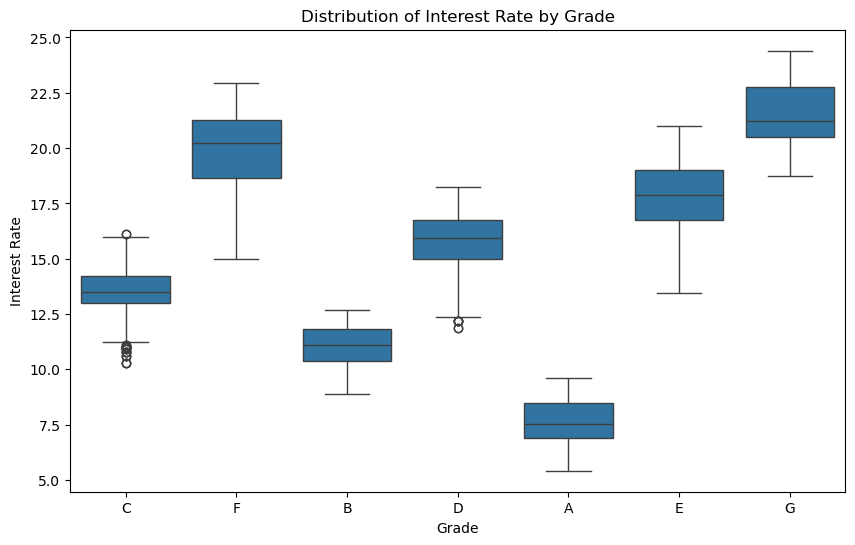

In [31]:
# Create a box plot to visualize the distribution of int_rate across grades
plt.figure(figsize=(10, 6))
sns.boxplot(x='grade', y='int_rate', data=charged_off_dataset)
plt.title('Distribution of Interest Rate by Grade')
plt.xlabel('Grade')
plt.ylabel('Interest Rate')
plt.show()

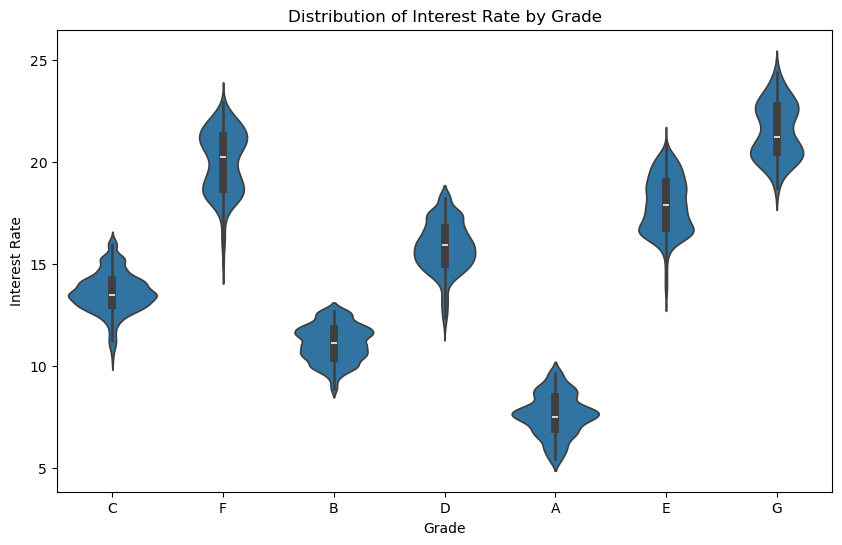

In [32]:
# Create a violin plot to show the density and distribution of int_rate across grades
plt.figure(figsize=(10, 6))
sns.violinplot(x='grade', y='int_rate', data=charged_off_dataset)
plt.title('Distribution of Interest Rate by Grade')
plt.xlabel('Grade')
plt.ylabel('Interest Rate')
plt.show()

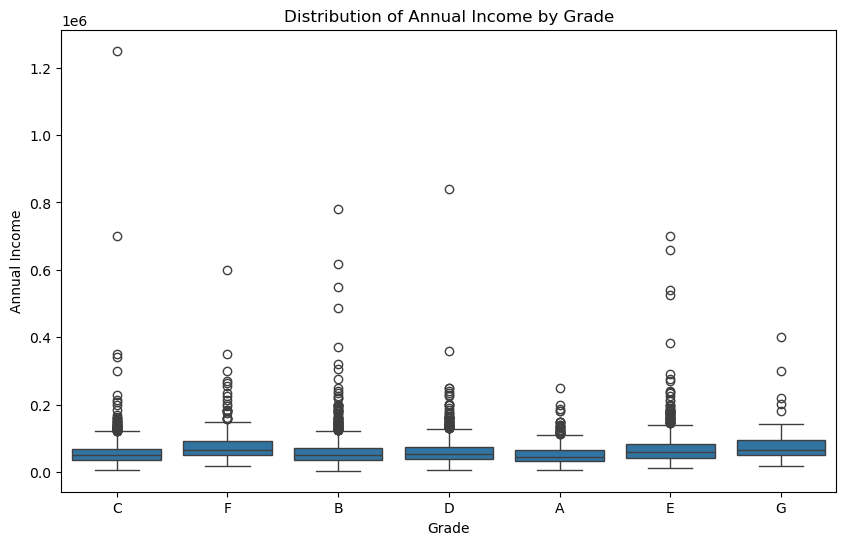

In [33]:
# Create a box plot to visualize the distribution of annual_inc across grades
plt.figure(figsize=(10, 6))
sns.boxplot(x='grade', y='annual_inc', data=charged_off_dataset)
plt.title('Distribution of Annual Income by Grade')
plt.xlabel('Grade')
plt.ylabel('Annual Income')
plt.show()

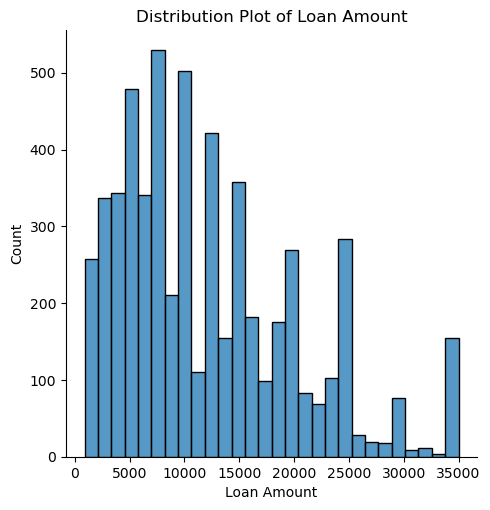

In [34]:
# Create a histogram to visualize the distribution of loan_amnt
sns.displot(charged_off_dataset['loan_amnt']) 
plt.title('Distribution Plot of Loan Amount')
plt.xlabel('Loan Amount')
plt.show()

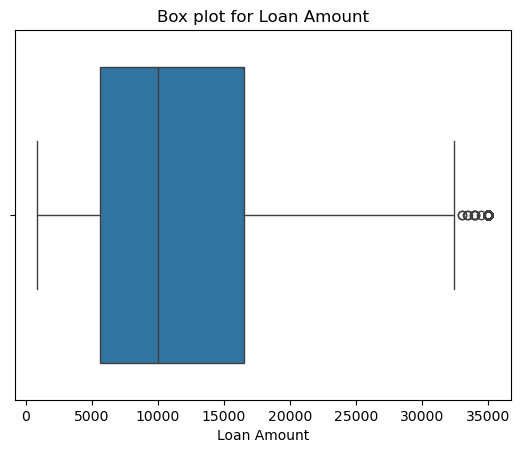

In [35]:
# Create a box plot to visualize the distribution of loan_amnt
sns.boxplot(x=charged_off_dataset['loan_amnt']) 
plt.title('Box plot for Loan Amount')
plt.xlabel('Loan Amount')
plt.show()

<Figure size 1000x600 with 0 Axes>

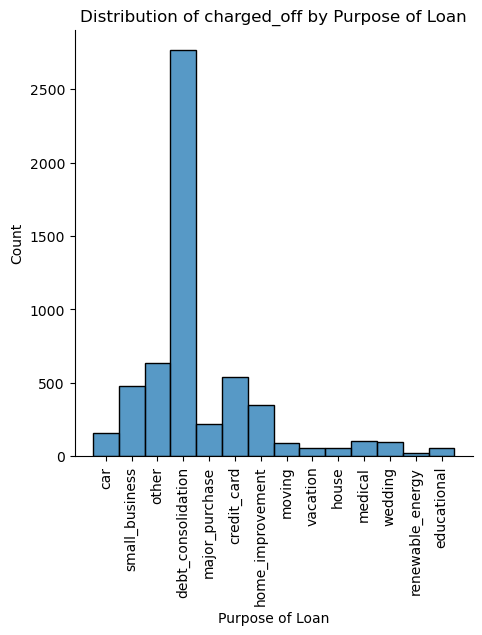

In [36]:
# Create a histogram to visualize the distribution of purpose
plt.figure(figsize=(10, 6), layout = 'tight')
sns.displot(charged_off_dataset['purpose']) 
plt.title('Distribution of charged_off by Purpose of Loan')
plt.xticks(rotation=90)
plt.xlabel('Purpose of Loan')
plt.show()

In [37]:
charged_off_dataset['emp_length'].value_counts()

emp_length
10+    1331
< 1     639
2       567
3       555
4       462
5       458
1       456
6       307
7       263
8       203
9       158
Name: count, dtype: int64

<Figure size 1000x600 with 0 Axes>

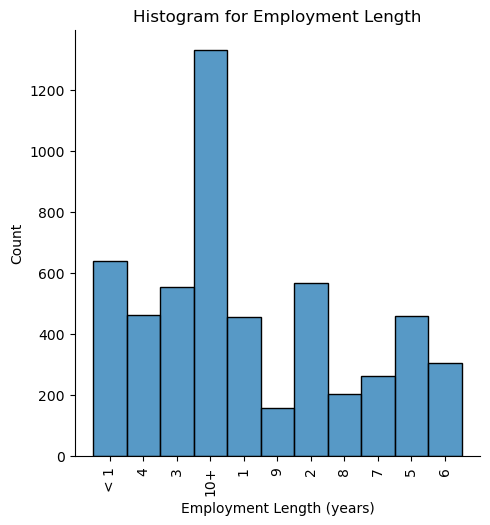

In [38]:
# Create a histogram to visualize the distribution of emp_length
plt.figure(figsize=(10, 6))
sns.displot(x=charged_off_dataset['emp_length']) 
plt.title('Histogram for Employment Length')
plt.xticks(rotation=90)
plt.xlabel('Employment Length (years)')
plt.show()

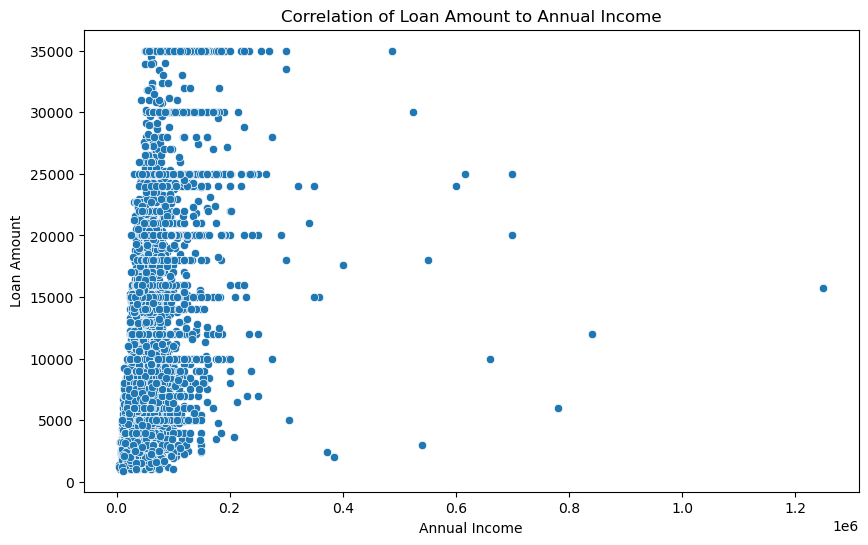

In [39]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='annual_inc', y='loan_amnt', data=charged_off_dataset)
plt.title('Correlation of Loan Amount to Annual Income')
plt.xlabel('Annual Income')
plt.ylabel('Loan Amount')
plt.show()

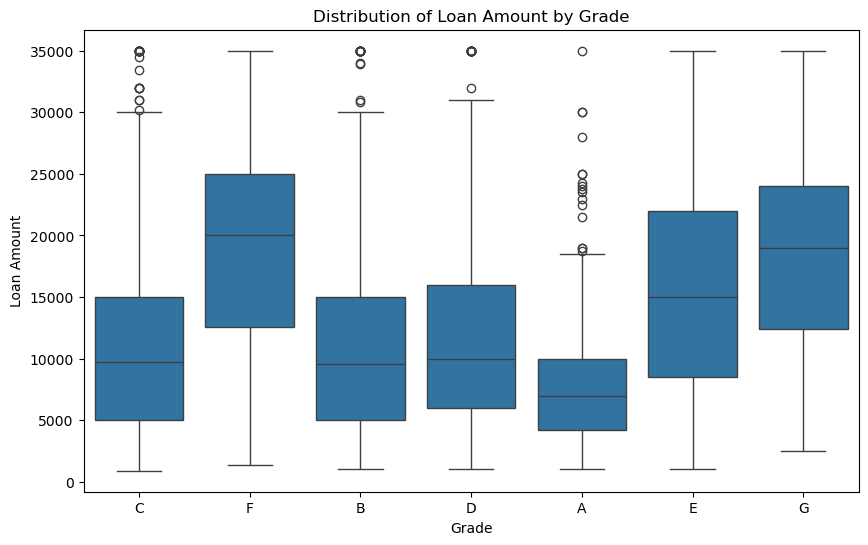

In [40]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='grade', y='loan_amnt', data=charged_off_dataset)
plt.title('Distribution of Loan Amount by Grade')
plt.xlabel('Grade')
plt.ylabel('Loan Amount')
plt.show()

In [51]:
print(charged_off_dataset['grade'].corr(charged_off_dataset['int_rate']))

ValueError: could not convert string to float: 'B'

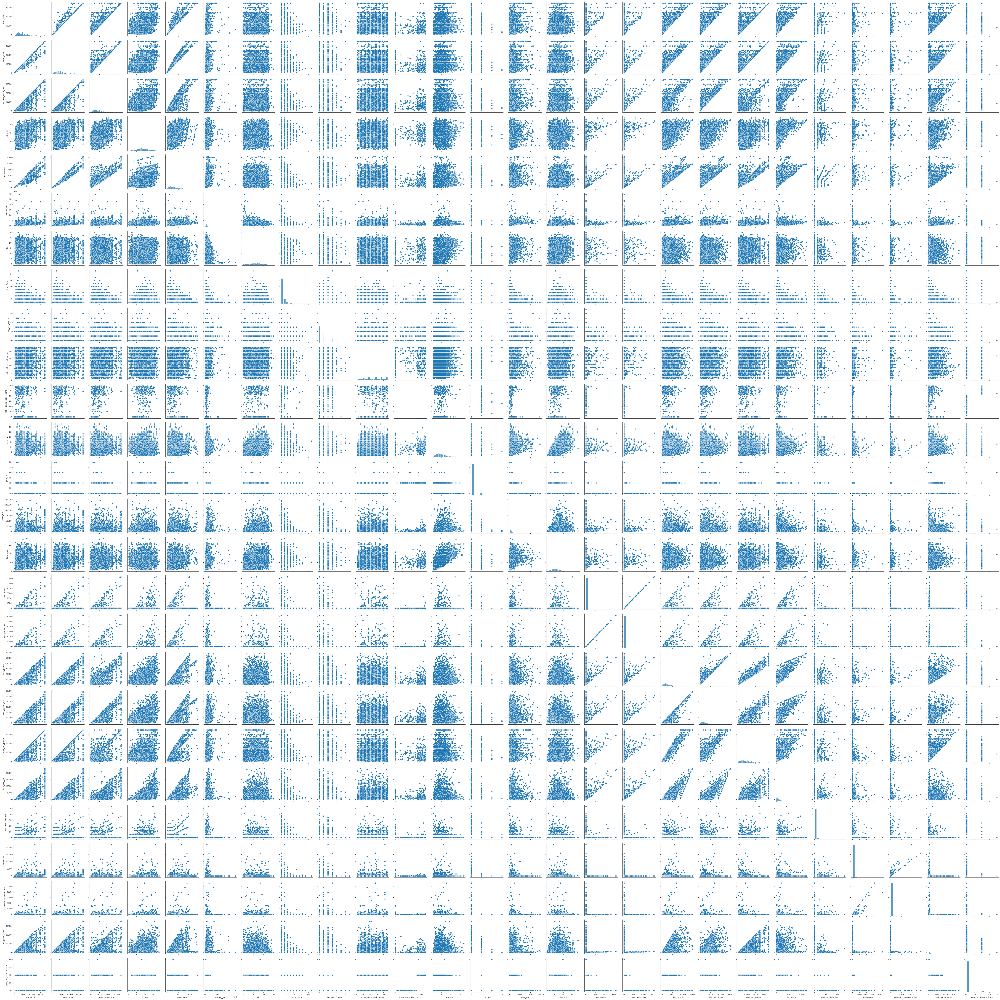

In [57]:
sns.set_style("ticks")

sns.pairplot(charged_off_dataset)

plt.show()